In [2]:
import re
import random
import math
from collections import Counter
from tqdm import tqdm

import numpy as np
import pandas as pd

import torch
import torch.nn as nn
import torch.optim as optim

from sklearn.linear_model import LogisticRegression
from sklearn.metrics import f1_score, confusion_matrix, classification_report

import matplotlib.pyplot as plt
import seaborn as sns

import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer
nltk.download("vader_lexicon")

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
DEVICE

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /home/naman/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


device(type='cuda')

In [3]:
class BPETokenizer:
    def __init__(self, vocab_size=20000):
        self.vocab_size = vocab_size
        self.merges = []
        self.token_to_id = {}
        self.id_to_token = {}

    def _preprocess(self, text):
        text = text.lower()
        text = re.sub(r"[^a-z0-9\s]", "", text)
        return text.split()

    def train(self, texts):
        vocab = Counter()
        for text in texts:
            for word in self._preprocess(text):
                vocab[tuple(list(word) + ["</w>"])] += 1

        def get_pair_stats(vocab):
            stats = Counter()
            for word, freq in vocab.items():
                for i in range(len(word) - 1):
                    stats[(word[i], word[i+1])] += freq
            return stats

        while True:
            stats = get_pair_stats(vocab)
            if not stats:
                break

            best = stats.most_common(1)[0][0]
            self.merges.append(best)

            new_vocab = {}
            for word, freq in vocab.items():
                new_word = []
                i = 0
                while i < len(word):
                    if i < len(word) - 1 and (word[i], word[i+1]) == best:
                        new_word.append(word[i] + word[i+1])
                        i += 2
                    else:
                        new_word.append(word[i])
                        i += 1
                new_vocab[tuple(new_word)] = freq

            vocab = new_vocab
            if len({sym for word in vocab for sym in word}) >= self.vocab_size:
                break

        tokens = sorted({sym for word in vocab for sym in word})
        self.token_to_id = {t: i for i, t in enumerate(tokens)}
        self.id_to_token = {i: t for t, i in self.token_to_id.items()}

    def encode(self, text):
        tokens = []
        for word in self._preprocess(text):
            symbols = list(word) + ["</w>"]
            for merge in self.merges:
                i = 0
                while i < len(symbols) - 1:
                    if (symbols[i], symbols[i+1]) == merge:
                        symbols[i:i+2] = ["".join(merge)]
                    else:
                        i += 1
            tokens.extend([self.token_to_id[s] for s in symbols if s in self.token_to_id])
        return tokens

    def decode(self, ids):
        return "".join(self.id_to_token[i] for i in ids).replace("</w>", " ")

In [4]:
wiki_path = "/home/naman/Cryptonite-RTP-NamanGoel/Task-0/archive/AllCombined.txt"

with open(wiki_path, encoding="utf-8") as f:
    wiki_sentences = [line.strip() for line in f if line.strip()]

wiki_sentences = wiki_sentences[:50000]
len(wiki_sentences)

50000

In [5]:
tokenizer = BPETokenizer(vocab_size=20000)
tokenizer.train(wiki_sentences)

vocab_size = len(tokenizer.token_to_id)
print("Final vocab size:", vocab_size)

Final vocab size: 20000


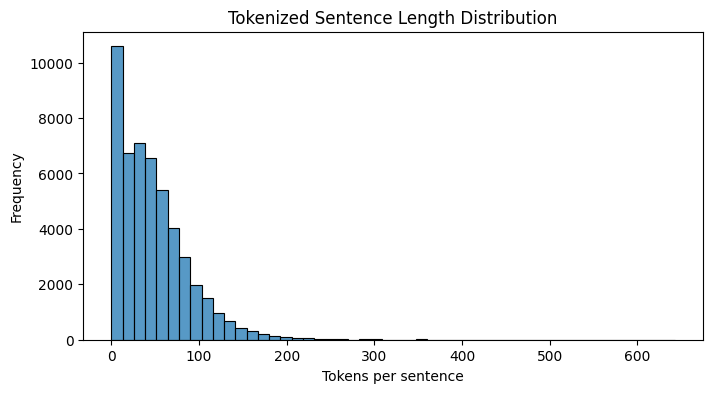

Mean length: 47.48924
95th percentile: 123.0


In [6]:
lengths = [len(tokenizer.encode(s)) for s in wiki_sentences]

plt.figure(figsize=(8,4))
sns.histplot(lengths, bins=50)
plt.title("Tokenized Sentence Length Distribution")
plt.xlabel("Tokens per sentence")
plt.ylabel("Frequency")
plt.show()

print("Mean length:", np.mean(lengths))
print("95th percentile:", np.percentile(lengths, 95))

In [7]:
token_counts = Counter()

for s in wiki_sentences:
    token_counts.update(tokenizer.encode(s))

unigram = np.zeros(vocab_size, dtype=np.float64)
for tid, c in token_counts.items():
    unigram[tid] = c

unigram = unigram ** 0.75
unigram /= unigram.sum()

unigram_dist = torch.tensor(unigram, device=DEVICE)

In [8]:
class CBOWDataset(torch.utils.data.Dataset):
    def __init__(self, texts, tokenizer, window):
        self.data = []
        for text in texts:
            tokens = tokenizer.encode(text)
            for i in range(window, len(tokens)-window):
                ctx = tokens[i-window:i] + tokens[i+1:i+window+1]
                self.data.append((ctx, tokens[i]))

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        c, t = self.data[idx]
        return torch.tensor(c), torch.tensor(t)

In [9]:
class CBOWNegSampling(nn.Module):
    def __init__(self, vocab_size, dim):
        super().__init__()
        self.in_embed = nn.Embedding(vocab_size, dim)
        self.out_embed = nn.Embedding(vocab_size, dim)

        nn.init.uniform_(self.in_embed.weight, -0.5/dim, 0.5/dim)
        nn.init.zeros_(self.out_embed.weight)

    def forward(self, ctx, target, neg):
        v = self.in_embed(ctx).mean(dim=1)
        pos = torch.sum(v * self.out_embed(target), dim=1)
        neg_score = torch.bmm(self.out_embed(neg), v.unsqueeze(2)).squeeze(2)

        loss = -(
            torch.log(torch.sigmoid(pos) + 1e-9) +
            torch.sum(torch.log(torch.sigmoid(-neg_score) + 1e-9), dim=1)
        )
        return loss.mean()

In [10]:
EMBED_DIM = 384

WINDOW = 8
#Small (2–3)	Learns grammar & syntax
#Medium (5–8)	Learns semantics (best for sentiment)
#Very large (15+)	Learns topic, loses sentiment

NEG_K = 10
#CBOW learns by:
#   Pulling correct context–target pairs closer
#   Pushing random pairs away
#K controls: “How many wrong examples do we show per correct one?”
#Small (2–5)	Fast, rough embeddings
#Medium (5–10)	Sharper semantic separation
#Very large (20+)	Slow, diminishing returns

BATCH = 512
EPOCHS = 20

dataset = CBOWDataset(wiki_sentences, tokenizer, WINDOW)
loader = torch.utils.data.DataLoader(dataset, batch_size=BATCH, shuffle=True)

model = CBOWNegSampling(vocab_size, EMBED_DIM).to(DEVICE)
optimizer = optim.Adam(model.parameters(), lr=0.001)

losses = []

for e in range(EPOCHS):
    total = 0
    for ctx, tgt in tqdm(loader):
        ctx, tgt = ctx.to(DEVICE), tgt.to(DEVICE)
        neg = torch.multinomial(unigram_dist, tgt.size(0)*NEG_K, True).view(tgt.size(0), NEG_K)

        optimizer.zero_grad()
        loss = model(ctx, tgt, neg)
        loss.backward()
        optimizer.step()
        total += loss.item()

    avg = total / len(loader)
    losses.append(avg)
    print(f"Epoch {e+1} | Loss {avg:.4f}")

100%|██████████| 3323/3323 [00:31<00:00, 104.86it/s]


Epoch 1 | Loss 3.2086


100%|██████████| 3323/3323 [00:30<00:00, 109.13it/s]


Epoch 2 | Loss 2.7548


100%|██████████| 3323/3323 [00:30<00:00, 109.21it/s]


Epoch 3 | Loss 2.4962


100%|██████████| 3323/3323 [00:29<00:00, 111.40it/s]


Epoch 4 | Loss 2.3365


100%|██████████| 3323/3323 [00:30<00:00, 109.58it/s]


Epoch 5 | Loss 2.2194


100%|██████████| 3323/3323 [00:30<00:00, 110.35it/s]


Epoch 6 | Loss 2.1198


100%|██████████| 3323/3323 [00:30<00:00, 109.08it/s]


Epoch 7 | Loss 2.0323


100%|██████████| 3323/3323 [00:30<00:00, 109.52it/s]


Epoch 8 | Loss 1.9522


100%|██████████| 3323/3323 [00:30<00:00, 110.08it/s]


Epoch 9 | Loss 1.8756


100%|██████████| 3323/3323 [00:30<00:00, 108.51it/s]


Epoch 10 | Loss 1.8059


100%|██████████| 3323/3323 [00:30<00:00, 109.17it/s]


Epoch 11 | Loss 1.7365


100%|██████████| 3323/3323 [00:30<00:00, 108.76it/s]


Epoch 12 | Loss 1.6723


100%|██████████| 3323/3323 [00:30<00:00, 108.97it/s]


Epoch 13 | Loss 1.6087


100%|██████████| 3323/3323 [00:30<00:00, 110.29it/s]


Epoch 14 | Loss 1.5494


100%|██████████| 3323/3323 [00:30<00:00, 109.09it/s]


Epoch 15 | Loss 1.4940


100%|██████████| 3323/3323 [00:30<00:00, 109.83it/s]


Epoch 16 | Loss 1.4402


100%|██████████| 3323/3323 [00:30<00:00, 110.40it/s]


Epoch 17 | Loss 1.3894


100%|██████████| 3323/3323 [00:31<00:00, 106.73it/s]


Epoch 18 | Loss 1.3412


100%|██████████| 3323/3323 [00:30<00:00, 110.56it/s]


Epoch 19 | Loss 1.2963


100%|██████████| 3323/3323 [00:30<00:00, 108.52it/s]

Epoch 20 | Loss 1.2548


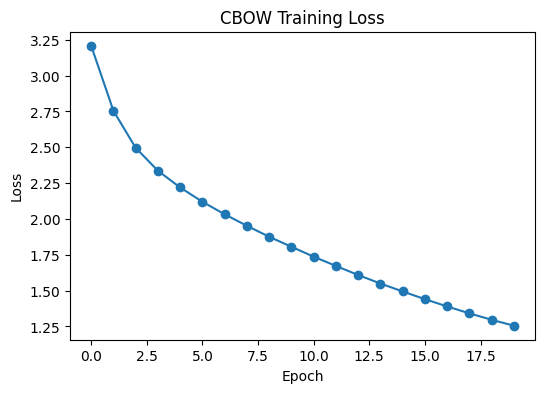

In [11]:
plt.figure(figsize=(6,4))
plt.plot(losses, marker="o")
plt.title("CBOW Training Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.show()

In [12]:
embeddings = model.in_embed.weight.detach().cpu().numpy()

In [13]:
pip install datasets

Note: you may need to restart the kernel to use updated packages.


In [15]:
texts = []
labels = []

label_map = {
    "negative": 0,
    "neutral": 1,
    "positive": 2
}

bad_lines = 0

with open(
    "/home/naman/Cryptonite-RTP-NamanGoel/Task-0/Sentences_AllAgree.txt",
    encoding="latin-1"
) as f:
    for line in f:
        line = line.strip()
        if not line:
            continue

        # Each line: <sentence>@<label>
        if "@" not in line:
            bad_lines += 1
            continue

        sentence, label = line.rsplit("@", 1)
        label = label.strip().lower()

        if label not in label_map:
            bad_lines += 1
            continue

        texts.append(sentence.strip())
        labels.append(label_map[label])

texts = np.array(texts)
labels = np.array(labels, dtype=np.int64)

print("Samples loaded:", len(texts))
print("Label distribution:", np.bincount(labels))

'''0 = negative → 303

1 = neutral → 1391

2 = positive → 570'''

print("Skipped malformed lines:", bad_lines)

Samples loaded: 2264
Label distribution: [ 303 1391  570]
Skipped malformed lines: 0


In [16]:
def doc_vector(text):
    ids = tokenizer.encode(text)
    if not ids:
        return np.zeros(EMBED_DIM)
    return embeddings[ids].mean(axis=0)

X = np.vstack([doc_vector(t) for t in texts])
y = labels


In [17]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score, accuracy_score

# Create index array
indices = np.arange(len(texts))

# Stratified split to preserve class distribution
idx_train, idx_test = train_test_split(
    indices,
    test_size=0.2,
    random_state=42,
    stratify=labels
)

print("Train size:", len(idx_train))
print("Test size:", len(idx_test))
print("Train distribution:", np.bincount(labels[idx_train]))
print("Test distribution:", np.bincount(labels[idx_test]))

# Train only on training portion
clf_mean = LogisticRegression(
    max_iter=1000,
    class_weight="balanced"
)

clf_mean.fit(X[idx_train], labels[idx_train])

# Evaluate only on test portion
pred_mean_test = clf_mean.predict(X[idx_test])

print("Mean Pooling - TEST Macro F1:",
      f1_score(labels[idx_test], pred_mean_test, average="macro"))

print("Mean Pooling - TEST Accuracy:",
      accuracy_score(labels[idx_test], pred_mean_test))

Train size: 1811
Test size: 453
Train distribution: [ 242 1113  456]
Test distribution: [ 61 278 114]
Mean Pooling - TEST Macro F1: 0.7580963650686846
Mean Pooling - TEST Accuracy: 0.8101545253863135


In [18]:
'''Logistic Regression learns by iterative optimization.
    This means:
        It slowly adjusts weights
        Each adjustment = one iteration

    max_iter=1000 means:
    If it hasn’t converged by 1000 steps, stop anyway.'''

'Logistic Regression learns by iterative optimization.\n    This means:\n        It slowly adjusts weights\n        Each adjustment = one iteration\n\n    max_iter=1000 means:\n    If it hasn’t converged by 1000 steps, stop anyway.'

In [19]:
'''class_weight = "balanced"

    The dataset has:
        Many neutral
        Fewer negative
        Medium positive

Without balancing:
Model would “play safe”
Predict neutral most of the time

Balanced weights mean:
“Misclassifying a rare class is penalized more.”

This directly improves macro F1.'''

'class_weight = "balanced"\n\n    The dataset has:\n        Many neutral\n        Fewer negative\n        Medium positive\n\nWithout balancing:\nModel would “play safe”\nPredict neutral most of the time\n\nBalanced weights mean:\n“Misclassifying a rare class is penalized more.”\n\nThis directly improves macro F1.'

In [20]:
sid = SentimentIntensityAnalyzer()

def vader_pred(t):
    c = sid.polarity_scores(t)["compound"]
    if c > 0.05: return 2
    if c < -0.05: return 0
    return 1
'''
compound is VADER’s final overall sentiment score.

Range: –1.0 to +1.0

Negative → negative sentiment

Positive → positive sentiment

Near zero → neutral sentiment
c is NOT a hyperparameter.
It is just a variable name holding that score.

Why the thresholds ±0.05?

These come from VADER’s original paper and documentation.

Rules:
c > 0.05 → positive
c < -0.05 → negative
otherwise → neutral
THAT IS WHY IT PERFORMS WORSE BECAUSE WE ARE NOT TUNING IT'''
v_preds_test = np.array([
    vader_pred(texts[i]) for i in idx_test
])

print("VADER - TEST Macro F1:",
      f1_score(labels[idx_test], v_preds_test, average="macro"))

print("VADER - TEST Accuracy:",
      accuracy_score(labels[idx_test], v_preds_test))


VADER - TEST Macro F1: 0.4997048588167922
VADER - TEST Accuracy: 0.5849889624724062


NameError: name 'preds' is not defined

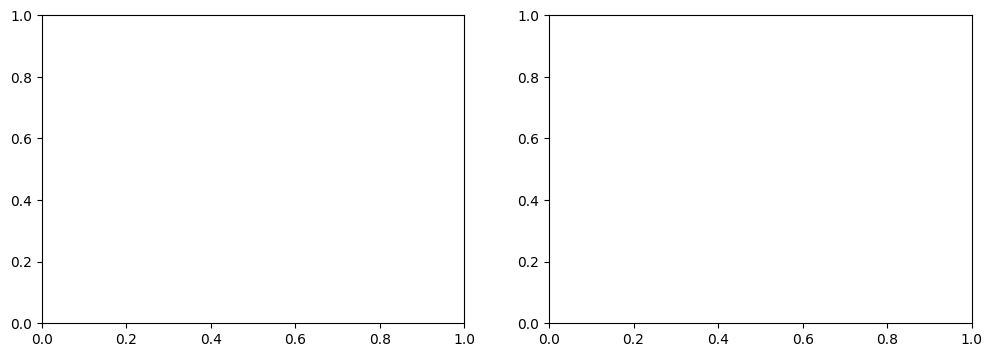

In [21]:
fig, ax = plt.subplots(1,2, figsize=(12,4))

sns.heatmap(confusion_matrix(y, preds), annot=True, fmt="d", ax=ax[0])
ax[0].set_title("CBOW + LR")

sns.heatmap(confusion_matrix(y, v_preds), annot=True, fmt="d", ax=ax[1])
ax[1].set_title("VADER")

plt.show()


In [ ]:
def build_sentence_vector(text, pooling="mean"):
    ids = tokenizer.encode(text)
    if not ids:
        return np.zeros(EMBED_DIM)

    vecs = embeddings[ids]

    if pooling == "mean":
        return vecs.mean(axis=0)

    elif pooling == "tfidf":
        weights = []
        for i in ids:
            weights.append(idf.get(i, 0.0))
        weights = np.array(weights)
        if weights.sum() == 0:
            return vecs.mean(axis=0)
        return np.average(vecs, axis=0, weights=weights)

    else:
        raise ValueError("Unknown pooling method")

In [ ]:
# User Input Classification
label_map_inv = {0: "Negative", 1: "Neutral", 2: "Positive"}

def classify_text(text, pooling="mean"):
    vec = build_sentence_vector(text, pooling=pooling)
    pred = clf.predict(vec.reshape(1, -1))[0]
    return label_map_inv[pred]

In [ ]:
# Sanity check before inference
required_vars = ["tokenizer", "embeddings", "clf", "EMBED_DIM"]

for v in required_vars:
    if v not in globals():
        raise RuntimeError(
            f"Required object '{v}' is not defined. "
            "Make sure all training cells have been run."
        )

print("All required objects are available. Ready for inference.")

All required objects are available. Ready for inference.


In [ ]:
# Random Financial Sentence Demo
import random

def random_demo(n=5, pooling="mean"):
    samples = random.sample(list(texts), n)
    for s in samples:
        print("Sentence:", s)
        print("Prediction:", classify_text(s, pooling=pooling))
        print("-" * 50)

random_demo()

Sentence: L&T 's net profit for the whole 2010 dropped to EUR 36 million from EUR 45 million for 2009 .
Prediction: Negative
--------------------------------------------------
Sentence: The Costanza light , with an aluminum base and washable shade , comes in white , pistachio , orange , blue and red .
Prediction: Neutral
--------------------------------------------------
Sentence: Sanoma also has an Executive Committee , in accordance with the Company 's Articles of Association , that prepares proposals for matters to be decided or noted by the Board of Directors .
Prediction: Neutral
--------------------------------------------------
Sentence: Incap Contract Manufacturing Services Private Limited has inked agreements with six new customers in India .
Prediction: Positive
--------------------------------------------------
Sentence: Maggie Ramsey 's wait - and those of thousands of Oregon and Washington guides , anglers and others who flock to his frequent seminars - is nearly over .
Pr

In [ ]:
# SEMANTIC ANALOGY TEST
def cosine_similarity(vec, mat):
    vec_norm = vec / (np.linalg.norm(vec) + 1e-9)
    mat_norm = mat / (np.linalg.norm(mat, axis=1, keepdims=True) + 1e-9)
    return np.dot(mat_norm, vec_norm)

In [ ]:
def analogy(word_a, word_b, word_c, top_k=5):
    def get_token_id(word):
        ids = tokenizer.encode(word)
        return ids[0] if ids else None

    a = get_token_id(word_a)
    b = get_token_id(word_b)
    c = get_token_id(word_c)

    if None in (a, b, c):
        print("One or more words not in vocabulary")
        return

    vec = embeddings[a] - embeddings[b] + embeddings[c]
    sims = cosine_similarity(vec, embeddings)

    best = sims.argsort()[-top_k:][::-1]
    for i in best:
        print(tokenizer.id_to_token[i], sims[i])

In [ ]:
# TF-IDF WEIGHTED MEAN
from math import log

doc_freq = Counter()
N = len(texts)

for s in texts:
    ids = set(tokenizer.encode(s))
    for i in ids:
        doc_freq[i] += 1

idf = {}
for token_id, df in doc_freq.items():
    idf[token_id] = log((N + 1) / (df + 1))


In [ ]:
# TF-IDF feature matrix
X_tfidf = np.vstack([
    build_sentence_vector(t, pooling="tfidf")
    for t in texts
])

clf_tfidf = LogisticRegression(
    max_iter=1000,
    class_weight="balanced"
)

clf_tfidf.fit(X_tfidf[idx_train], labels[idx_train])

pred_tfidf_test = clf_tfidf.predict(X_tfidf[idx_test])

print("TF-IDF Pooling - TEST Macro F1:",
      f1_score(labels[idx_test], pred_tfidf_test, average="macro"))

print("TF-IDF Pooling - TEST Accuracy:",
      accuracy_score(labels[idx_test], pred_tfidf_test))


TF-IDF Weighted Mean Macro F1: 0.8410101493819022


In [ ]:
print("MEAN pooling:")
random_demo(pooling="mean")

print("\nTF-IDF pooling:")
random_demo(pooling="tfidf")


MEAN pooling:
Sentence: Finnair said that the cancellation of flights would cause daily losses of  x20ac 2.5 million US$ 3 million .
Prediction: Negative
--------------------------------------------------
Sentence: Digia will also set up two subsidiaries , Digia Norway AS and Digia USA Inc. .
Prediction: Neutral
--------------------------------------------------
Sentence: The product range includes marinated olives , cold cuts , and pates , for example .
Prediction: Neutral
--------------------------------------------------
Sentence: The Board of Directors was authorized to decide on other terms of the share issue .
Prediction: Neutral
--------------------------------------------------
Sentence: Merrill Lynch analyst Campbell Morgan upgraded his recommendation on PaperlinX from `` neutral '' to `` buy '' in May .
Prediction: Negative
--------------------------------------------------

TF-IDF pooling:
Sentence: 27 January 2011 - Finnish IT solutions provider Affecto Oyj ( HEL : AFE1V ) 

In [ ]:
def analogy(a, b, c, top_k=5):
    def tok(word):
        ids = tokenizer.encode(word)
        return ids[0] if ids else None

    ia, ib, ic = tok(a), tok(b), tok(c)
    if None in (ia, ib, ic):
        print("Token not found")
        return

    vec = embeddings[ia] - embeddings[ib] + embeddings[ic]

    norms = np.linalg.norm(embeddings, axis=1) * np.linalg.norm(vec)
    sims = embeddings @ vec / (norms + 1e-9)

    best = sims.argsort()[-top_k:][::-1]
    for i in best:
        print(f"{tokenizer.id_to_token[i]:<15} {sims[i]:.3f}")


In [ ]:
while True:
    s = input("Enter financial sentence (or 'q' to quit): ")
    if s.lower() == "q":
        break
    print("Prediction:", classify_text(s, pooling="mean"))
    print("-" * 50)

Prediction: Neutral
--------------------------------------------------


Prediction: Neutral
--------------------------------------------------
Prediction: Neutral
--------------------------------------------------
Prediction: Neutral
--------------------------------------------------
Prediction: Neutral
--------------------------------------------------
Prediction: Neutral
--------------------------------------------------
Prediction: Neutral
--------------------------------------------------
Prediction: Neutral
--------------------------------------------------
Prediction: Neutral
--------------------------------------------------
Prediction: Neutral
--------------------------------------------------
Prediction: Neutral
--------------------------------------------------
Prediction: Neutral
--------------------------------------------------
Prediction: Neutral
--------------------------------------------------
Prediction: Neutral
--------------------------------------------------
Prediction: Neutral
--------------------------------------------------
Predic